# Profitability of long-short ESG portfolio
Construct a portfolio consisting of at least 30 stocks, taking a long position in stocks with
high ESG ratings and a short position in stocks with low ESG ratings (e.g., long 15 stocks
and short 15 stocks). Track the performance of the ESG portfolio over time and compute
the risk-adjusted returns of the portfolio

In [1]:
import pandas as pd
import yfinance as yf
from datetime import datetime
import requests
import io

def get_sp500_symbols():
    # Primary source: Wikipedia
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    }
    try:
        print("Attempting to fetch S&P 500 symbols from Wikipedia...")
        response = requests.get(url, headers=headers)
        response.raise_for_status()  # Check for HTTP errors
        tables = pd.read_html(io.StringIO(response.text))
        sp500_table = tables[0]  # First table contains the constituents
        symbols = sp500_table['Symbol'].tolist()
        print("Successfully fetched symbols from Wikipedia.")
        print(symbols[:5])
        return symbols
    except Exception as e:
        print(f"Failed to fetch from Wikipedia: {e}")
        print("Falling back to alternative source...")
        # Fallback: CSV from GitHub
        fallback_url = "https://raw.githubusercontent.com/datasets/s-and-p-500-companies/main/data/constituents_symbols.csv"
        try:
            response = requests.get(fallback_url, headers=headers)
            response.raise_for_status()
            sp500_table = pd.read_csv(io.StringIO(response.text))
            symbols = sp500_table['Symbol'].tolist()
            print("Successfully fetched symbols from fallback source.")
        except Exception as e:
            print(f"Failed to fetch from fallback source: {e}")
            return []



if __name__ == "__main__":
    symbols = get_sp500_symbols()
    if symbols:
        print(f"Fetched {len(symbols)} S&P 500 symbols as of {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}:")
        print(symbols)
    else:
        print("No symbols fetched. Please check your internet connection or try again later.")
    tickers = symbols

Attempting to fetch S&P 500 symbols from Wikipedia...
Successfully fetched symbols from Wikipedia.
['MMM', 'AOS', 'ABT', 'ABBV', 'ACN']
Fetched 503 S&P 500 symbols as of 2025-09-19 17:00:45:
['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A', 'APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEE', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AME', 'AMGN', 'APH', 'ADI', 'AON', 'APA', 'APO', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'ADP', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BAX', 'BDX', 'BRK.B', 'BBY', 'TECH', 'BIIB', 'BLK', 'BX', 'XYZ', 'BK', 'BA', 'BKNG', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BF.B', 'BLDR', 'BG', 'BXP', 'CHRW', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CAT', 'CBOE', 'CBRE', 'CDW', 'COR', 'CNC', 'CNP', 'CF', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', '

In [3]:
import pandas as pd

def get_first_of_months_pandas(start_date, end_date):
    date_range = pd.date_range(start=start_date, end=end_date, freq='MS')
    return date_range

# we would use 5 years to backtest the strategy from 2020 to 2024
months = []
dates = get_first_of_months_pandas('2020-01-01', '2024-12-01')
for date in dates:
    #print(date.strftime("%Y-%m-%d"))
    months.append(date.strftime("%Y-%m-%d"))
print(months)


['2020-01-01', '2020-02-01', '2020-03-01', '2020-04-01', '2020-05-01', '2020-06-01', '2020-07-01', '2020-08-01', '2020-09-01', '2020-10-01', '2020-11-01', '2020-12-01', '2021-01-01', '2021-02-01', '2021-03-01', '2021-04-01', '2021-05-01', '2021-06-01', '2021-07-01', '2021-08-01', '2021-09-01', '2021-10-01', '2021-11-01', '2021-12-01', '2022-01-01', '2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', '2022-12-01', '2023-01-01', '2023-02-01', '2023-03-01', '2023-04-01', '2023-05-01', '2023-06-01', '2023-07-01', '2023-08-01', '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01', '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01', '2024-05-01', '2024-06-01', '2024-07-01', '2024-08-01', '2024-09-01', '2024-10-01', '2024-11-01', '2024-12-01']


In [4]:
import time
import requests
import pandas as pd

def fetch_esg(symbol, max_retries=5):
    url = f"https://query2.finance.yahoo.com/v1/finance/esgChart?symbol={symbol}"
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64)",
        "Referer":    "https://finance.yahoo.com/quote/" + symbol
    }

    for i in range(max_retries):
        resp = requests.get(url, headers=headers)
        if resp.status_code == 200:
            data = resp.json()
            #print(data["esgChart"]["result"][0].keys())
            series = data["esgChart"]["result"][0].get("symbolSeries", [])
            df = pd.DataFrame(series)
            
            #print(df.columns[0])
            #test = df.loc[:, df.columns[0]]  # Assuming the second column contains the timestamps
            #df["timestamp"] = pd.to_datetime(df[str("timestamp")], unit="s")
            return df
        elif resp.status_code == 429:
            backoff = (i + 1) * 5
            print(f"Rate limited, sleeping {backoff}s…")
            time.sleep(backoff)
        else:
            resp.raise_for_status()

    raise RuntimeError("Failed to fetch after retries")

In [ ]:
import pandas as pd
from joblib import Parallel, delayed

holder = [] 
tickers_matched = []
holder_tmp = [] 
tickers_matched_tmp = []


for month in months:
    try:
        results = Parallel(n_jobs=-1)(delayed(fetch_esg)(symbol) for symbol in tickers)
    except Exception as e:
        print(f"Error fetching ESG data: {e}")
        continue

    for df, symbol in zip(results, tickers):
        try:
            df["timestamp"] = pd.to_datetime(df["timestamp"], unit="s")
            df['symbol'] = symbol
            df.set_index("timestamp", inplace=True)
            print(df.head())
            if df.loc[str(month)].empty:
                print(f"No data for {symbol} on {month}")
            else:
                holder_tmp.append(df.loc[str(month), "esgScore"])
                tickers_matched_tmp.append(symbol)
                #print(f"Fetched ESG data for {symbol} on {month}")
        except Exception as e:
            #print(f"Error fetching ESG data for {symbol}: {e}")
            continue
    holder.append(holder_tmp)
    #print(holder)
    tickers_matched.append(tickers_matched_tmp)
    holder_tmp = []
    tickers_matched_tmp = []
    print(f"Completed ESG data fetch for month: {month}")


            esgScore  governanceScore  environmentScore  socialScore symbol
timestamp                                                                  
2014-09-01      73.0             73.0              73.0         74.0    MMM
2014-10-01      72.0             73.0              72.0         74.0    MMM
2014-11-01      73.0             73.0              73.0         74.0    MMM
2014-12-01      73.0             73.0              73.0         74.0    MMM
2015-01-01      74.0             78.0              70.0         76.0    MMM
            esgScore  governanceScore  environmentScore  socialScore symbol
timestamp                                                                  
2016-09-01     46.51            57.85             43.25        42.14    AOS
2016-10-01     46.51            57.85             43.25        42.14    AOS
2016-11-01     46.51            57.85             43.25        42.14    AOS
2016-12-01     46.51            57.85             43.25        42.14    AOS
2017-01-01  

In [6]:
# find common tickers across all months
common_tickers = set(tickers_matched[0])
for tickers in tickers_matched[1:]:
    common_tickers.intersection_update(tickers)
print(len(common_tickers))

409


In [7]:
# keep only common tickers in holder and tickers_matched
holder = [[holder[i][j] for j, ticker in enumerate(tickers_matched[i]) if ticker in common_tickers] for i in range(len(holder))]
tickers_matched = [[ticker for ticker in tickers_matched[i] if ticker in common_tickers] for i in range(len(tickers_matched))]
print(len(holder))
print(len(tickers_matched[0]))
print(len(months))

60
409
60


In [ ]:
holder = pd.DataFrame(holder, index=months, columns=tickers_matched[0])

print(len(tickers))
print(holder.head())

488
              MMM    AOS    ABT   ABBV    ACN   ADBE    AES    AFL      A  \
2020-01-01  34.53  25.14  30.62  30.35  15.32  13.59  33.69  24.38  17.52   
2020-02-01  34.53  32.05  30.63  30.35  15.45  13.59  33.69  24.38  17.52   
2020-03-01  33.54  32.05  31.26  30.35  15.45  13.59  33.69  23.62  17.52   
2020-04-01    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2020-05-01    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

              APD  ...    WDC     WY    WMB   WDAY   WYNN    XEL    XYL  \
2020-01-01  12.32  ...  17.95  19.44  31.91  15.78  28.07  28.97  18.13   
2020-02-01  12.16  ...  17.95  19.44  30.53  15.78  26.34  28.97  18.13   
2020-03-01  11.62  ...  17.95  19.44  30.53  15.78  26.72  28.97  18.13   
2020-04-01    NaN  ...    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
2020-05-01    NaN  ...    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

              YUM    ZBH   ZTS  
2020-01-01  20.26  33.71  28.3  
2020-02-01  18.1

In [9]:
holder.fillna(method='ffill', inplace=True)

/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/3925875442.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  holder.fillna(method='ffill', inplace=True)


In [10]:
# the column of YUM of holder
print(holder['YUM'].head(20))

2020-01-01    20.26
2020-02-01    18.12
2020-03-01    18.12
2020-04-01    18.12
2020-05-01    18.12
2020-06-01    18.12
2020-07-01    18.12
2020-08-01    18.12
2020-09-01    18.12
2020-10-01    18.14
2020-11-01    18.14
2020-12-01    18.14
2021-01-01    17.96
2021-02-01    21.31
2021-03-01    21.31
2021-04-01    21.31
2021-05-01    21.31
2021-06-01    21.31
2021-07-01    21.31
2021-08-01    21.31
Name: YUM, dtype: float64


In [11]:
# find the top 15 stocks with the highest ESG scores and save them to a list
# create a dictionary for each month
top_15_dict = {}
for month in months:
    top_15 = holder.loc[month].nlargest(15).index.tolist()
    top_15_dict[month] = top_15
    print(f"Top 15 stocks for {month}: {top_15}")
print(top_15_dict)

Top 15 stocks for 2020-01-01: ['CF', 'GE', 'EOG', 'ROP', 'TSN', 'PCG', 'CVX', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'BA', 'GD', 'TXT']
Top 15 stocks for 2020-02-01: ['CF', 'GE', 'EOG', 'ROP', 'TSN', 'OXY', 'PCG', 'CVX', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'BA', 'GD']
Top 15 stocks for 2020-03-01: ['CF', 'GE', 'EOG', 'TSN', 'OXY', 'PCG', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'CVX', 'BA', 'GD', 'TXT']
Top 15 stocks for 2020-04-01: ['CF', 'GE', 'EOG', 'TSN', 'OXY', 'PCG', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'CVX', 'BA', 'GD', 'TXT']
Top 15 stocks for 2020-05-01: ['CF', 'GE', 'EOG', 'TSN', 'OXY', 'PCG', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'CVX', 'BA', 'GD', 'TXT']
Top 15 stocks for 2020-06-01: ['CF', 'GE', 'EOG', 'TSN', 'OXY', 'PCG', 'DXCM', 'TDG', 'FCX', 'NRG', 'FE', 'CVX', 'BA', 'GD', 'TXT']
Top 15 stocks for 2020-07-01: ['CF', 'EOG', 'GE', 'TSN', 'PCG', 'OXY', 'FCX', 'TDG', 'NRG', 'AEE', 'CVX', 'APA', 'BA', 'FE', 'NUE']
Top 15 stocks for 2020-08-01: ['CF', 'EOG', 'GE', 'TSN', 'PCG', 'OXY', 'TDG'

In [12]:
# similarly, find the bottom 15 stocks with the lowest ESG scores and save them to a list
# create a dictionary for each month
bottom_15_dict = {}
for month in months:
    bottom_15 = holder.loc[month].nsmallest(15).index.tolist()
    bottom_15_dict[month] = bottom_15
    print(f"Bottom 15 stocks for {month}: {bottom_15}")
print(bottom_15_dict)

Bottom 15 stocks for 2020-01-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'TRMB', 'BBY', 'AZO', 'APD', 'HAS', 'MTD', 'AVB', 'SYY']
Bottom 15 stocks for 2020-02-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'TRMB', 'BBY', 'APD', 'AZO', 'MTD', 'HAS', 'AVB', 'SYY']
Bottom 15 stocks for 2020-03-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'APD', 'TRMB', 'BBY', 'AZO', 'MTD', 'HAS', 'LOW', 'AVB']
Bottom 15 stocks for 2020-04-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'APD', 'TRMB', 'BBY', 'AZO', 'MTD', 'HAS', 'LOW', 'AVB']
Bottom 15 stocks for 2020-05-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'APD', 'TRMB', 'BBY', 'AZO', 'MTD', 'HAS', 'LOW', 'AVB']
Bottom 15 stocks for 2020-06-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'HPQ', 'APD', 'TRMB', 'BBY', 'AZO', 'MTD', 'HAS', 'LOW', 'AVB']
Bottom 15 stocks for 2020-07-01: ['CBRE', 'TEL', 'KEYS', 'PLD', 'REG', 'CDW', 'CRM', 'ACN', 'APD', 'MTD', 'HPQ', 'BBY', 'AZO', 'CSCO', 'MCO']
Bottom

In [13]:
# find unique tickers in top_15_dict and bottom_15_dict
unique_top_15 = set()
for month, tickers in top_15_dict.items():
    unique_top_15.update(tickers)

unique_bottom_15 = set()
for month, tickers in bottom_15_dict.items():
    unique_bottom_15.update(tickers)
print(f"Unique top 15 tickers across months: {unique_top_15}")
print(f"Unique bottom 15 tickers across months: {unique_bottom_15}")
unique_top_15 = list(unique_top_15)
unique_bottom_15 = list(unique_bottom_15)
unique_stock_list = unique_top_15 + unique_bottom_15
print(f"Total unique tickers in long and short portfolios: {len(unique_stock_list)}")

Unique top 15 tickers across months: {'NRG', 'AES', 'FE', 'FCX', 'TDG', 'DXCM', 'TXT', 'FTV', 'DVN', 'CF', 'GE', 'CVX', 'XOM', 'OXY', 'CAT', 'ADM', 'MMM', 'EQT', 'MOS', 'ALB', 'PWR', 'GD', 'PSX', 'COP', 'NUE', 'TSN', 'KHC', 'WFC', 'AEE', 'PCG', 'EOG', 'BA', 'APA', 'ROP'}
Unique bottom 15 tickers across months: {'SBAC', 'EA', 'IR', 'SYY', 'CDW', 'MCO', 'TEL', 'EQR', 'AMT', 'ADBE', 'CSCO', 'HPE', 'STX', 'HPQ', 'APTV', 'LOW', 'CBRE', 'CI', 'PLD', 'CCI', 'AZO', 'BBY', 'AVB', 'WELL', 'TRMB', 'KIM', 'MTD', 'APD', 'HD', 'HAS', 'LKQ', 'KEYS', 'NWSA', 'REG', 'ACN', 'DHR', 'CRM', 'WDC', 'IPG'}
Total unique tickers in long and short portfolios: 73


In [ ]:
# get the end of month dates from 2020-01-31 to 2024-12-31 for calculating returns
from pandas.tseries.offsets import MonthEnd
def get_end_of_months_pandas(start_date, end_date):
    dates = pd.date_range(start=start_date, end=end_date, freq='M')
    return dates

months = []
dates = get_end_of_months_pandas('2020-01-31', '2024-12-31')
for date in dates:
    #print(date.strftime("%Y-%m-%d"))
    months.append(date.strftime("%Y-%m-%d"))
print(months)


['2020-01-31', '2020-02-29', '2020-03-31', '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30', '2022-05-31', '2022-06-30', '2022-07-31', '2022-08-31', '2022-09-30', '2022-10-31', '2022-11-30', '2022-12-31', '2023-01-31', '2023-02-28', '2023-03-31', '2023-04-30', '2023-05-31', '2023-06-30', '2023-07-31', '2023-08-31', '2023-09-30', '2023-10-31', '2023-11-30', '2023-12-31', '2024-01-31', '2024-02-29', '2024-03-31', '2024-04-30', '2024-05-31', '2024-06-30', '2024-07-31', '2024-08-31', '2024-09-30', '2024-10-31', '2024-11-30', '2024-12-31']


/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/2380122119.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(start=start_date, end=end_date, freq='M')


In [17]:
# Load the data from yahoo finance
import os
import yfinance as yf

def load_data(symbol):

    direc = '/Users/tszholee/Downloads/some_data/'
    os.makedirs(direc, exist_ok=True)

    file_name = os.path.join(direc, symbol + '.csv')

    #if not os.path.exists(file_name):

    ticker = yf.Ticker(symbol)
    df = ticker.history(start='2020-01-01', end='2024-12-31')

    df.to_csv(file_name)

    df = pd.read_csv(file_name)
    df["Date"] = df["Date"].astype("string")
    df["Date"] = df["Date"].str[:10]
    df['Date'] = pd.to_datetime(df["Date"], format='%Y-%m-%d')
    df.set_index(df["Date"], inplace=True, drop=True)

    df = df.resample('M').agg({
        "Open":'first',                       # We will open position at the first day open price every month
        "Close":"last",                       # We will close position at the last day close price every month
        "Date":"last"
        })
    df['this_month_return'] = (df["Close"] - df["Open"]) / df["Open"]
    df["next_month_return"] = df['this_month_return'].shift(-1)
    df['symbol'] = symbol
    if len(df) == 0:
        os.remove(file_name)
        return None

    return df

holder = []
ticker_with_data = []
for symbol in unique_stock_list:
    df = load_data(symbol)
    if df is not None:
        holder.append(df)
        ticker_with_data.append(symbol)

tickers = ticker_with_data[:]
print (f'Loaded data for {len(tickers)} companies')
print(len(tickers))

/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.resample('M').agg({
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.resample('M').agg({
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.resample('M').agg({
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.resample('M').agg({
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future vers

Loaded data for 73 companies
73


/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/4254560790.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.resample('M').agg({


In [18]:
trade = pd.DataFrame()

for symbol in holder:
    if symbol['symbol'][0] in unique_top_15:
        symbol['rank'] = 1
    elif symbol['symbol'][0] in unique_bottom_15:
        symbol['rank'] = -1
    symbol["rank"] = symbol["rank"].fillna(0)
    trade = pd.concat([trade, symbol])

trade = trade.sort_index()

/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/2268501077.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if symbol['symbol'][0] in unique_top_15:
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/2268501077.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if symbol['symbol'][0] in unique_top_15:
/var/folders/pz/17g6xfjd1rn7z2r1pq38xt480000gn/T/ipykernel_40447/2268501077.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by po

In [19]:
print(trade)

                  Open       Close       Date  this_month_return  \
Date                                                               
2020-01-31   33.298507   31.091625 2020-01-31          -0.066276   
2020-01-31   70.445940   67.497086 2020-01-31          -0.041860   
2020-01-31   10.276299    5.667422 2020-01-31          -0.448496   
2020-01-31  173.881704  179.028915 2020-01-31           0.029602   
2020-01-31  119.638944  106.832001 2020-01-31          -0.107047   
...                ...         ...        ...                ...   
2024-12-31  105.414212   84.643646 2024-12-30          -0.197038   
2024-12-31  112.003812  102.275421 2024-12-30          -0.086858   
2024-12-31  357.663570  347.528259 2024-12-30          -0.028338   
2024-12-31  154.711595  114.309586 2024-12-30          -0.261144   
2024-12-31   29.390764   26.744247 2024-12-30          -0.090046   

            next_month_return symbol  rank  
Date                                        
2020-01-31          -0.10

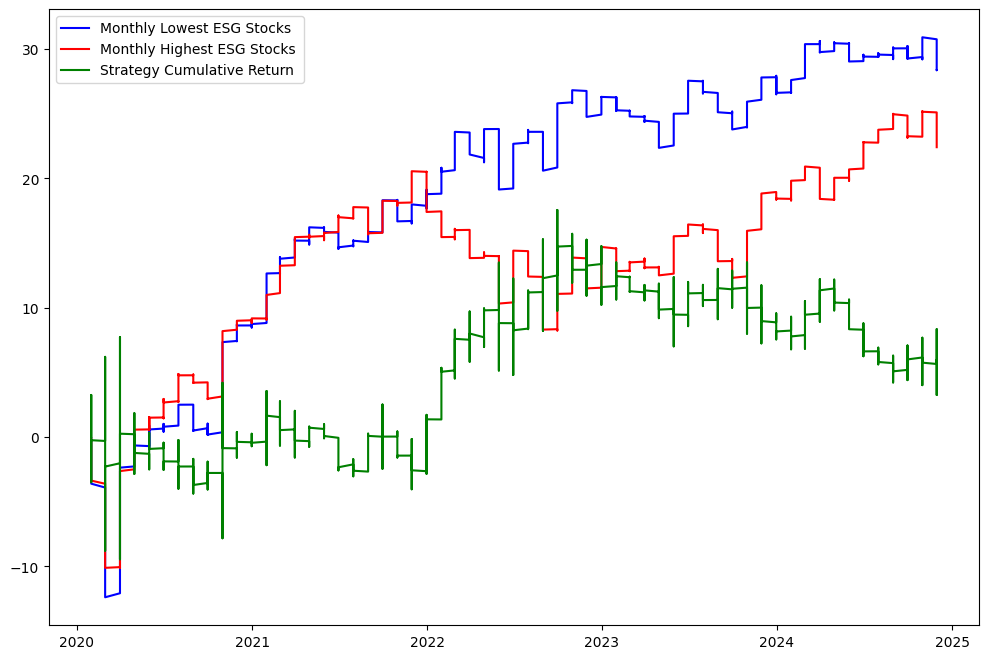

In [22]:
long_positions = trade.loc[trade['rank'] == 1, "next_month_return"].cumsum()
short_positions = trade.loc[trade['rank'] == -1, "next_month_return"].cumsum()

# plot the long_positions and short_positions over time
import matplotlib.pyplot as plt
fig, ax1 = plt.subplots(figsize=(12, 8))
ax1.plot(long_positions, label = "Monthly Lowest ESG Stocks", color ="blue")
ax1.plot(short_positions, label = "Monthly Highest ESG Stocks", color ="red")
cumulative_return = long_positions - short_positions
ax1.plot(cumulative_return, label = "Strategy Cumulative Return ", color= "green")
ax1.legend()

In [23]:
import numpy as np

# Calculate the sharpe ratio of the strategy
risk = pd.concat([trade.loc[trade["rank"]==1, "this_month_return"], trade.loc[trade["rank"]==-1, "next_month_return"]]).std()
sharpe_ratio = (trade.loc[trade["rank"]==1, "this_month_return"] - trade.loc[trade["rank"]==-1, "next_month_return"]).mean() / risk *np.sqrt(12)
print(f'Sharpe Ratio of the strategy: {sharpe_ratio}')

Sharpe Ratio of the strategy: 0.15464852575409918
